In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
!pip install tensorflow

In [2]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [3]:
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Dropout, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import preprocess_input
def preprocess_for_vit(image):
    return image / 255.0

datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    vertical_flip=True,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    preprocessing_function=preprocess_for_vit,
    fill_mode='nearest',
    brightness_range=(0.5, 1.5),
)
batch_size = 32


train_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/train',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

validation_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/valid',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

test_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary',shuffle=True,seed=1
)

Found 934 images belonging to 2 classes.
Found 215 images belonging to 2 classes.
Found 135 images belonging to 2 classes.


In [4]:
class_names = ["plain","pothole"]
for i in range(len(class_names)):
    print(i," ",class_names[i])

0   plain
1   pothole


In [5]:
!pip install vit_keras

In [6]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 3.5 MB/s eta 0:00:00


In [7]:
!pip install vit-keras==0.1.0

  Attempting uninstall: vit-keras
    Found existing installation: vit-keras 0.1.2
    Uninstalling vit-keras-0.1.2:
      Successfully uninstalled vit-keras-0.1.2


In [12]:
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model
from vit_keras import vit

# Load a pre-trained Vision Transformer model
# You can choose a different size (e.g., B_16, L_32, etc.) based on your requirements
vit_model = vit.vit_l16(
    image_size = 224,
    activation = 'softmax',
    pretrained = True,
    include_top = True,
    pretrained_top = True,
    classes = 2
)

# Set all layers in the Vision Transformer model to non-trainable
for layer in vit_model.layers:
    layer.trainable = False

# Create the input layer
input = Input(shape=(224, 224, 3))

# Add Vision Transformer as a layer
x = vit_model(input)

# Add new classifier layers
x = Dense(2048, activation='relu')(x)
x = Dropout(0.35)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.25)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.2)(x)
output = Dense(2, activation='softmax')(x)

# Create the final model
model = Model(inputs=input, outputs=output)

# Display the model summary
model.summary()


/usr/local/lib/python3.10/dist-packages/vit_keras/vit.py:139: UserWarning: Can only use pretrained_top with imagenet21k+imagenet2012 if classes = 1000. Setting manually.
  warnings.warn(


1218991142/1218991142 [==============================] - 8s 0us/step


/usr/local/lib/python3.10/dist-packages/vit_keras/utils.py:81: UserWarning: Resizing position embeddings from 24, 24 to 14, 14
  warnings.warn(


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vit-l16 (Functional)        (None, 1000)              304326632 
                                                                 
 dense_5 (Dense)             (None, 2048)              2050048   
                                                                 
 dropout_4 (Dropout)         (None, 2048)              0         
                                                                 
 dense_6 (Dense)             (None, 1024)              2098176   
                                                                 
 dropout_5 (Dropout)         (None, 1024)              0         
                                                                 
 dense_7 (Dense)             (None, 512)               5248

In [13]:
#compile the model
import keras
import tensorflow as tf
model.compile(optimizer="adam", loss='binary_crossentropy', metrics=['accuracy'])

#early stopping function
early = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5)

In [15]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=30,  # You can change the number of epochs based on your requirement
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size
)


Epoch 1/30
 1/29 [>.............................] - ETA: 1:15 - loss: 0.6481 - accuracy: 0.8438

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


29/29 [==============================] - 234s 8s/step - loss: 0.4235 - accuracy: 0.8392 - val_loss: 0.4559 - val_accuracy: 0.7969
Epoch 2/30
29/29 [==============================] - 51s 2s/step - loss: 0.3177 - accuracy: 0.8769 - val_loss: 0.3203 - val_accuracy: 0.8646
Epoch 3/30
29/29 [==============================] - 51s 2s/step - loss: 0.2732 - accuracy: 0.9024 - val_loss: 0.2613 - val_accuracy: 0.9219
Epoch 4/30
29/29 [==============================] - 50s 2s/step - loss: 0.2749 - accuracy: 0.8980 - val_loss: 0.2487 - val_accuracy: 0.9062
Epoch 5/30
29/29 [==============================] - 50s 2s/step - loss: 0.2313 - accuracy: 0.9146 - val_loss: 0.2665 - val_accuracy: 0.9219
Epoch 6/30
29/29 [==============================] - 51s 2s/step - loss: 0.2586 - accuracy: 0.9124 - val_loss: 0.4098 - val_accuracy: 0.8333
Epoch 7/30
29/29 [==============================] - 51s 2s/step - loss: 0.2783 - accuracy: 0.8991 - val_loss: 0.2815 - val_accuracy: 0.8802
Epoch 8/30
29/29 [============

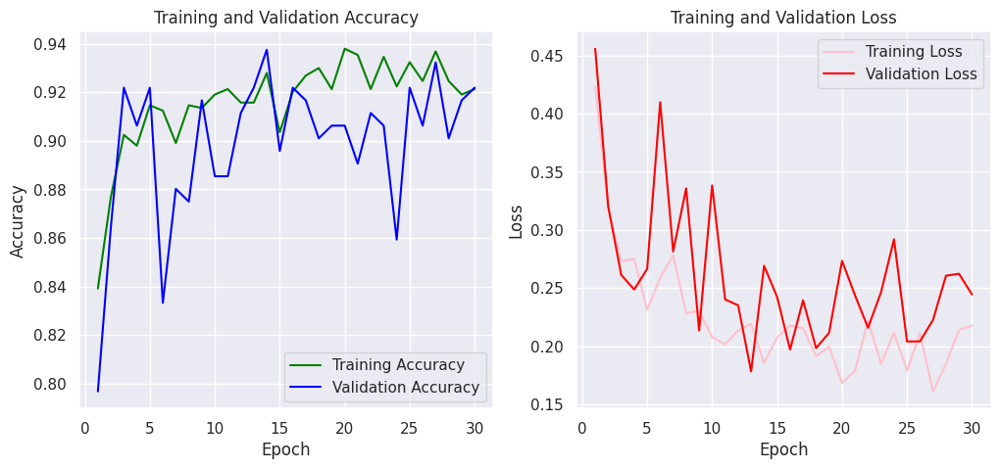

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)

# Accuracy plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'green', label='Training Accuracy')
plt.plot(epochs, val_acc, 'blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'pink', label='Training Loss')
plt.plot(epochs, val_loss, 'red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()


1/1 [==============================] - 0s 177ms/step


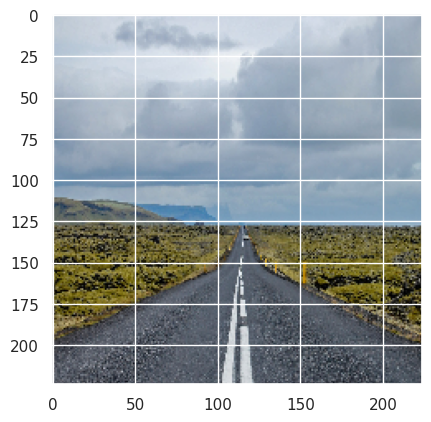

Predicted: Plain
1/1 [==============================] - 0s 214ms/step


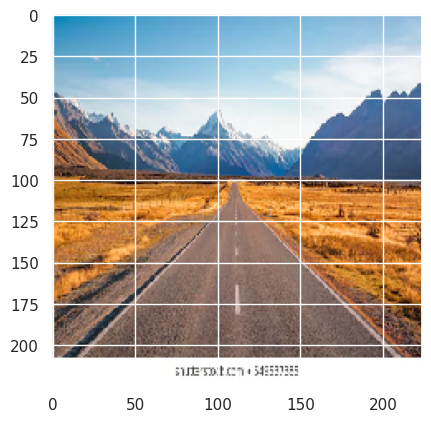

Predicted: Plain
1/1 [==============================] - 0s 193ms/step


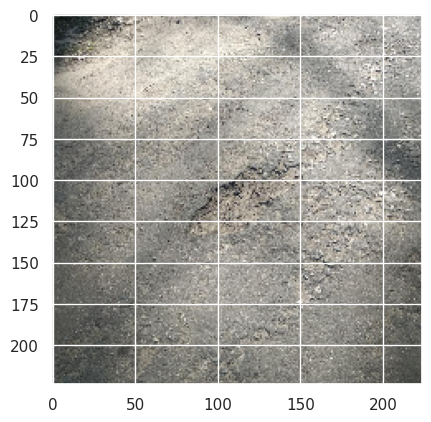

Predicted: Pothole
1/1 [==============================] - 0s 172ms/step


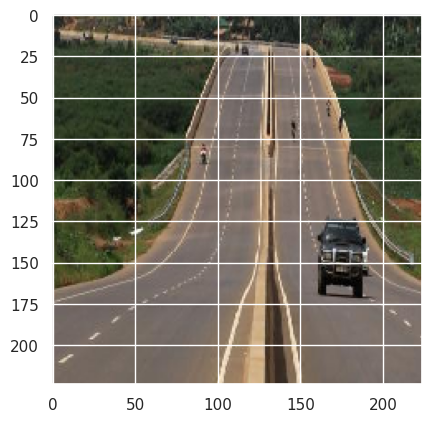

Predicted: Plain
1/1 [==============================] - 0s 128ms/step


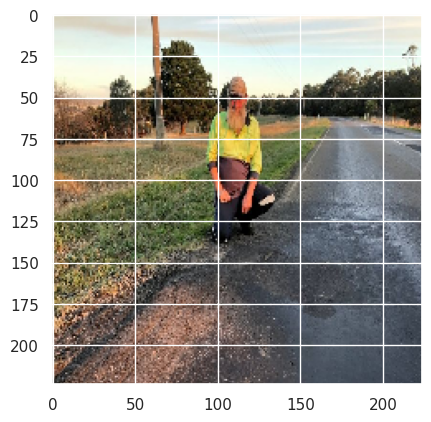

Predicted: Pothole
1/1 [==============================] - 0s 139ms/step


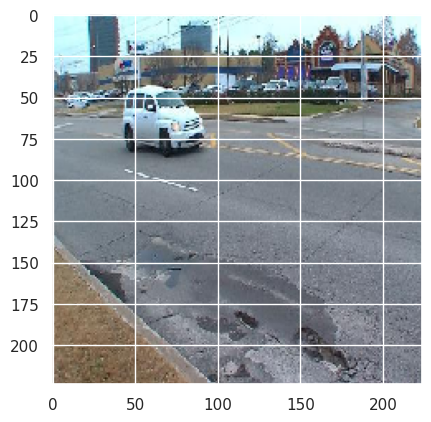

Predicted: Pothole
1/1 [==============================] - 0s 140ms/step


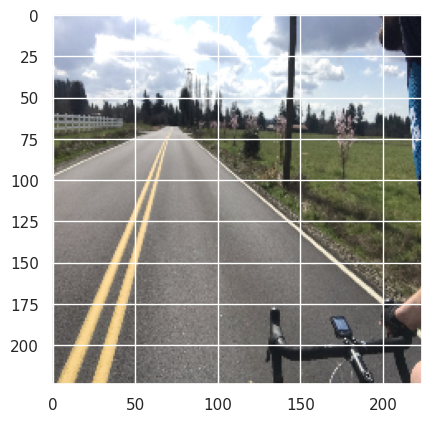

Predicted: Plain
1/1 [==============================] - 0s 132ms/step


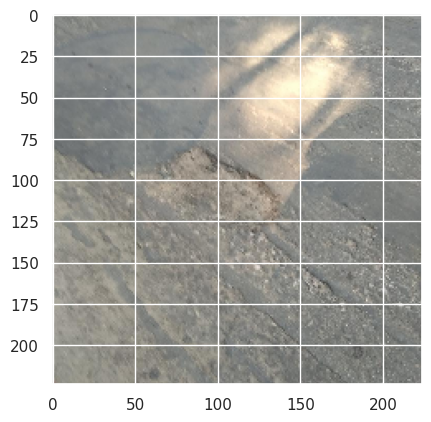

Predicted: Pothole
1/1 [==============================] - 0s 156ms/step


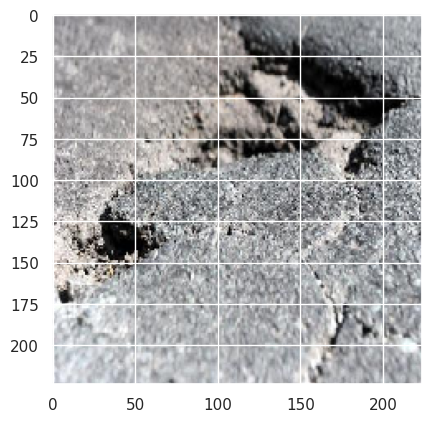

Predicted: Pothole
1/1 [==============================] - 0s 137ms/step


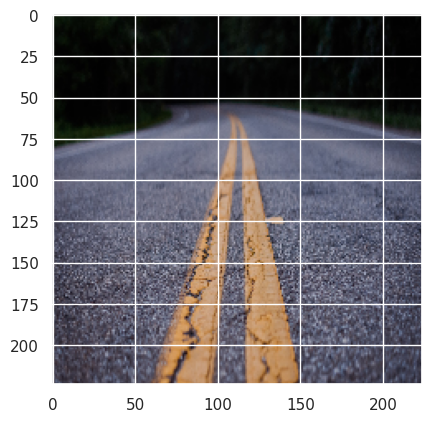

Predicted: Plain
1/1 [==============================] - 0s 145ms/step


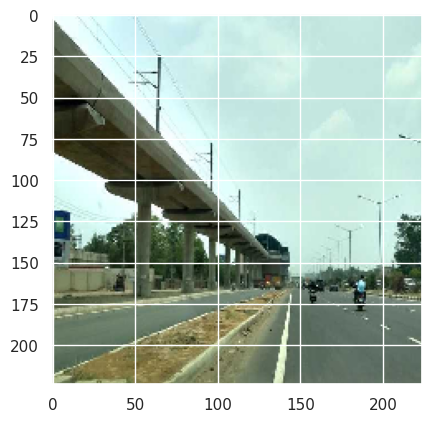

Predicted: Plain
1/1 [==============================] - 0s 133ms/step


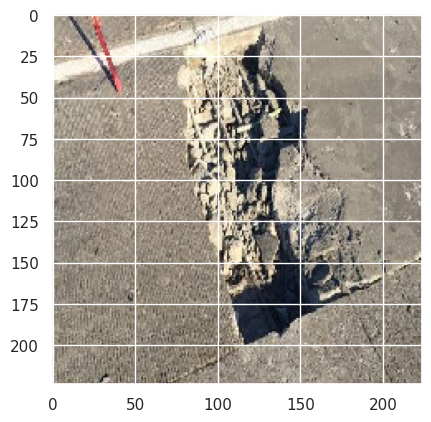

Predicted: Pothole
1/1 [==============================] - 0s 148ms/step


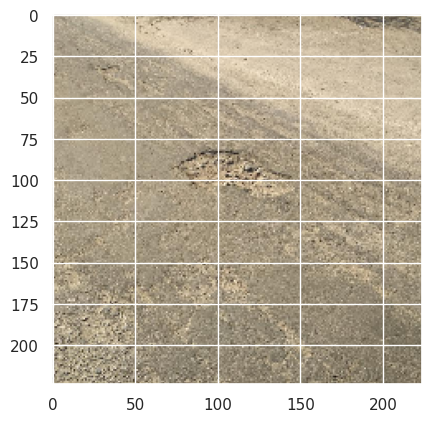

Predicted: Pothole
1/1 [==============================] - 0s 188ms/step


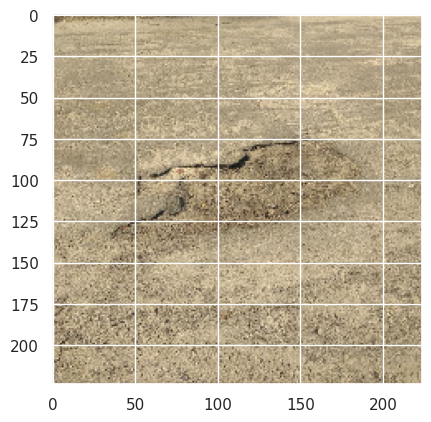

Predicted: Pothole
1/1 [==============================] - 0s 180ms/step


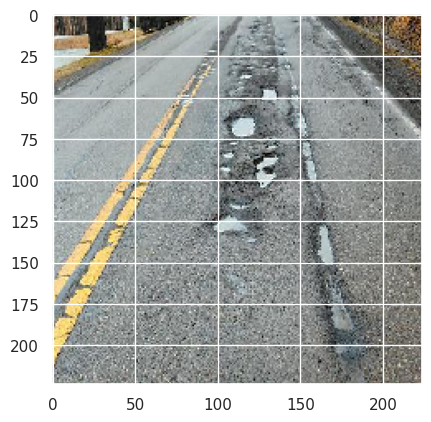

Predicted: Plain
1/1 [==============================] - 0s 181ms/step


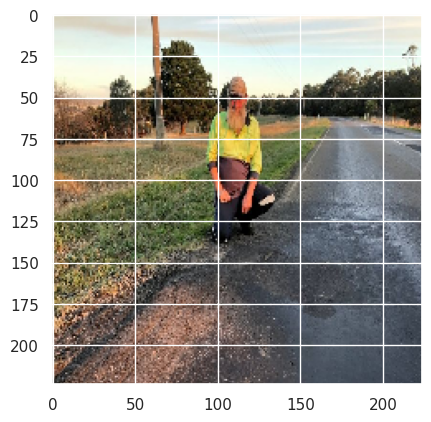

Predicted: Pothole
1/1 [==============================] - 0s 203ms/step


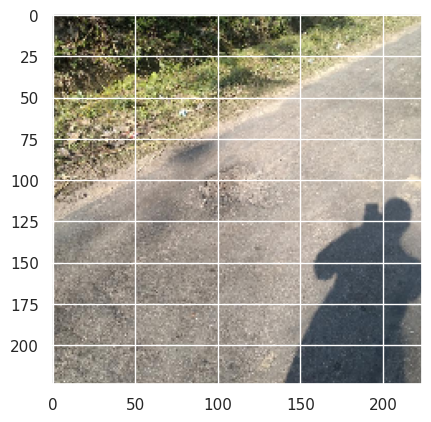

Predicted: Pothole
1/1 [==============================] - 0s 200ms/step


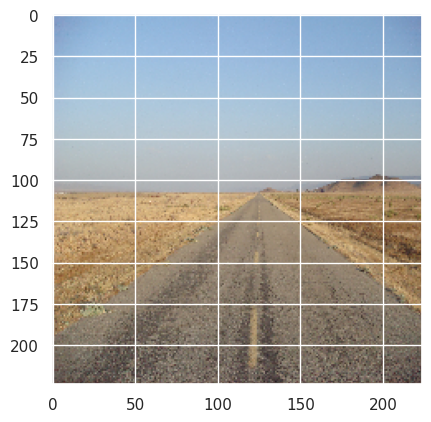

Predicted: Plain
1/1 [==============================] - 0s 173ms/step


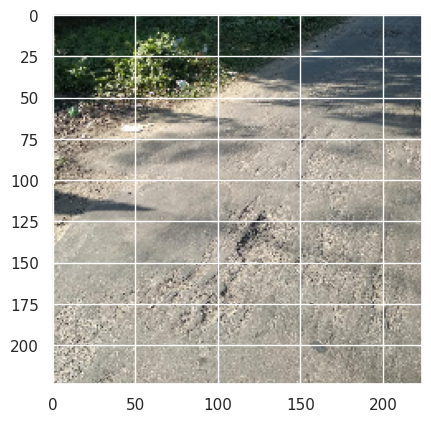

Predicted: Pothole
1/1 [==============================] - 0s 196ms/step


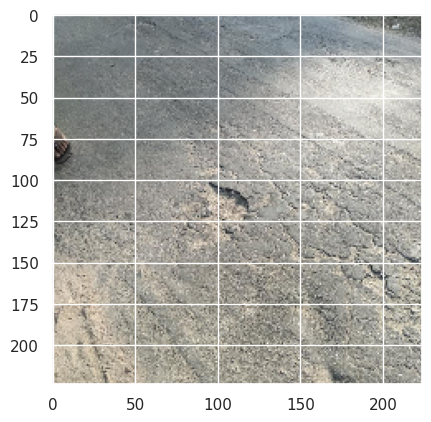

Predicted: Pothole
1/1 [==============================] - 0s 148ms/step


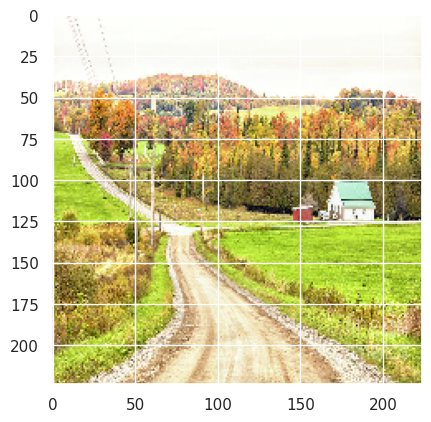

Predicted: Plain
1/1 [==============================] - 0s 146ms/step


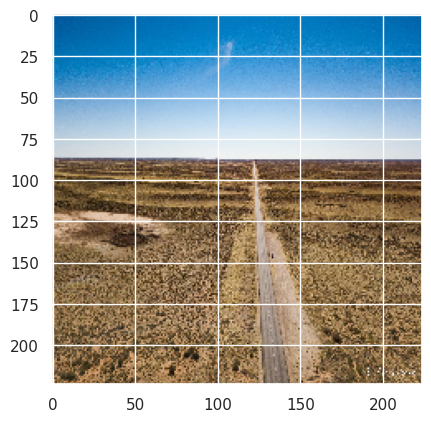

Predicted: Pothole
1/1 [==============================] - 0s 151ms/step


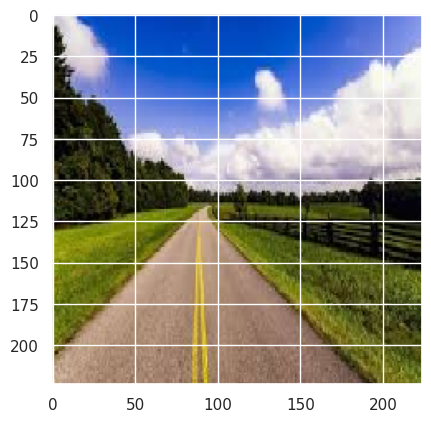

Predicted: Plain
1/1 [==============================] - 0s 147ms/step


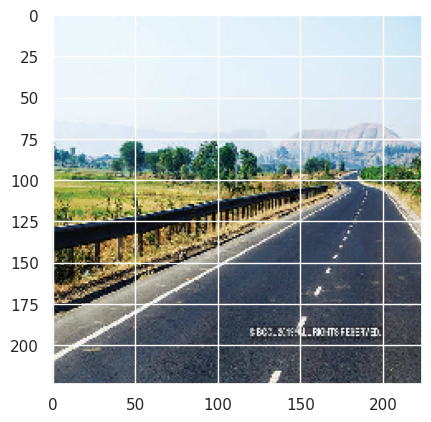

Predicted: Plain
1/1 [==============================] - 0s 159ms/step


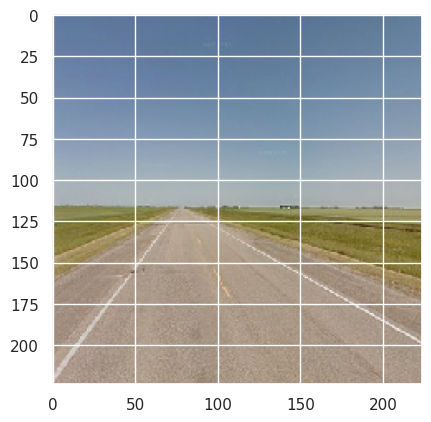

Predicted: Plain
1/1 [==============================] - 0s 154ms/step


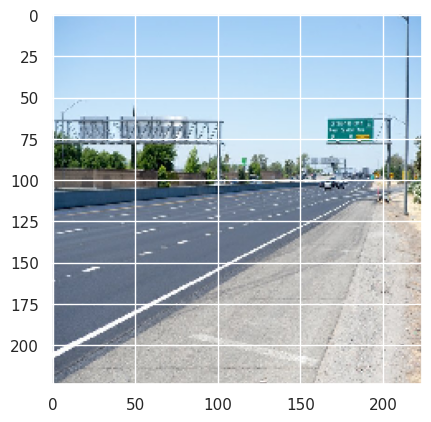

Predicted: Plain
1/1 [==============================] - 0s 152ms/step


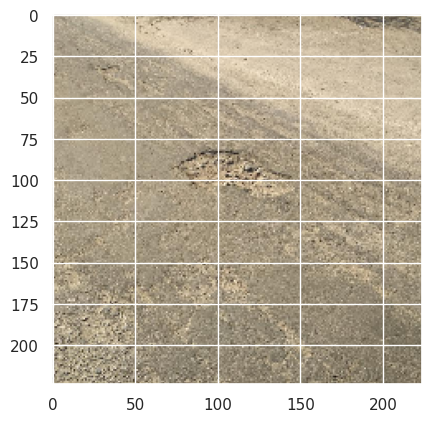

Predicted: Pothole
1/1 [==============================] - 0s 154ms/step


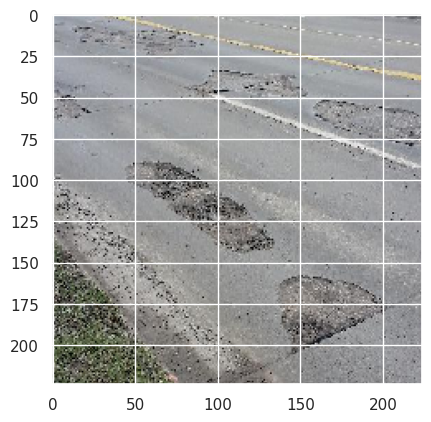

Predicted: Pothole
1/1 [==============================] - 0s 153ms/step


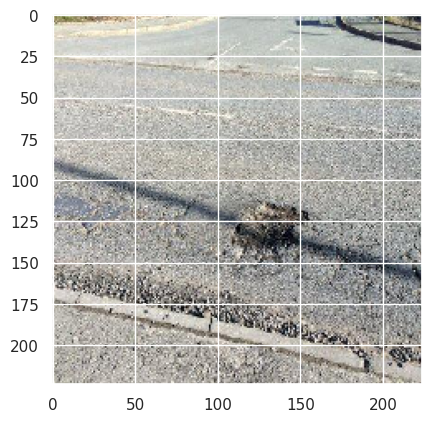

Predicted: Pothole
1/1 [==============================] - 0s 157ms/step


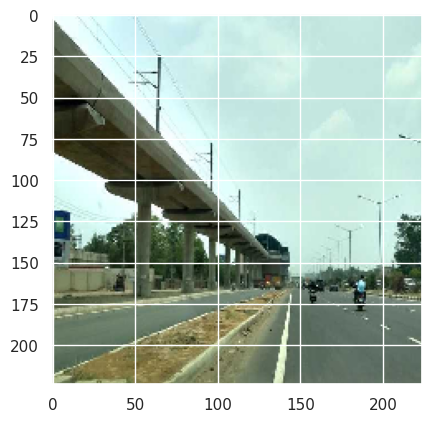

Predicted: Plain
1/1 [==============================] - 0s 167ms/step


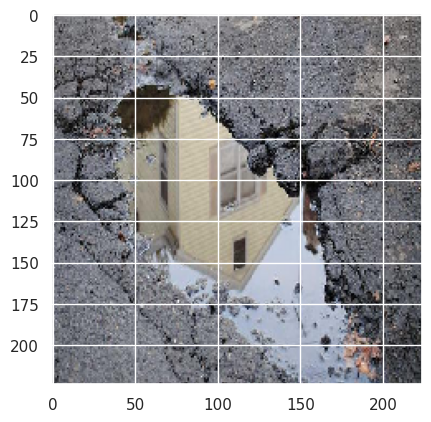

Predicted: Pothole
1/1 [==============================] - 0s 166ms/step


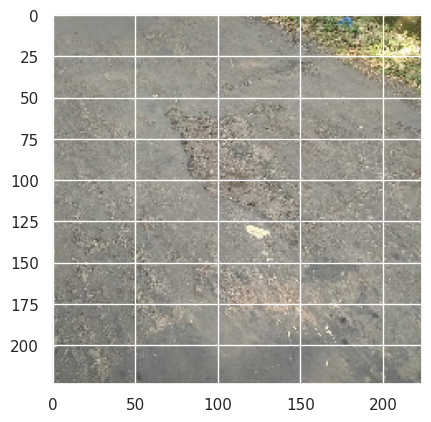

Predicted: Pothole
1/1 [==============================] - 0s 165ms/step


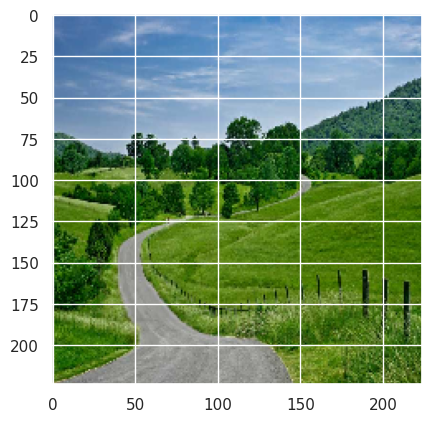

Predicted: Plain
1/1 [==============================] - 0s 162ms/step


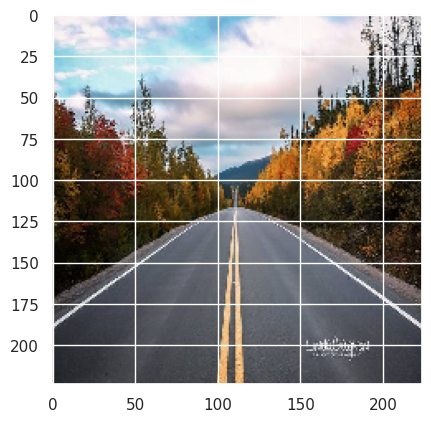

Predicted: Plain
1/1 [==============================] - 0s 153ms/step


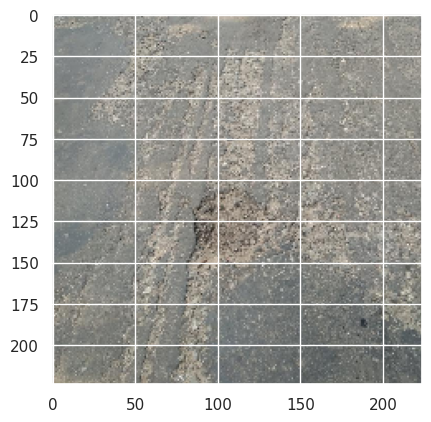

Predicted: Pothole
1/1 [==============================] - 0s 181ms/step


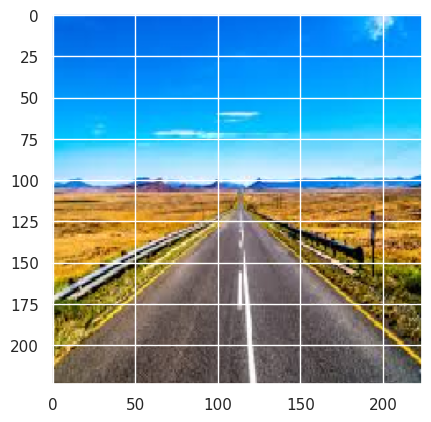

Predicted: Plain
1/1 [==============================] - 0s 174ms/step


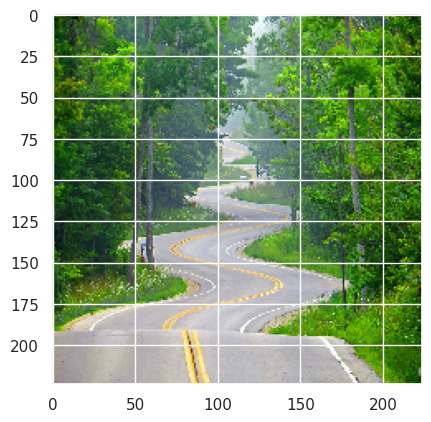

Predicted: Plain
1/1 [==============================] - 0s 156ms/step


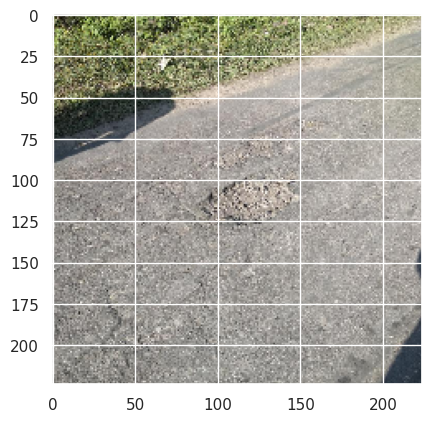

Predicted: Pothole
1/1 [==============================] - 0s 198ms/step


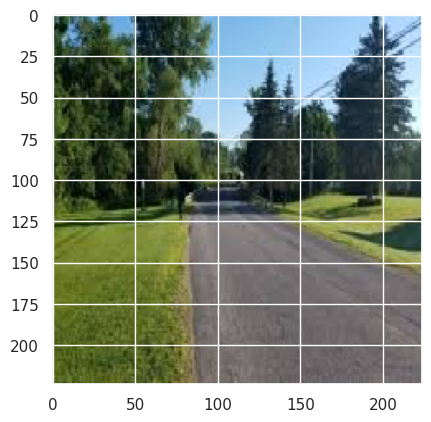

Predicted: Plain
1/1 [==============================] - 0s 193ms/step


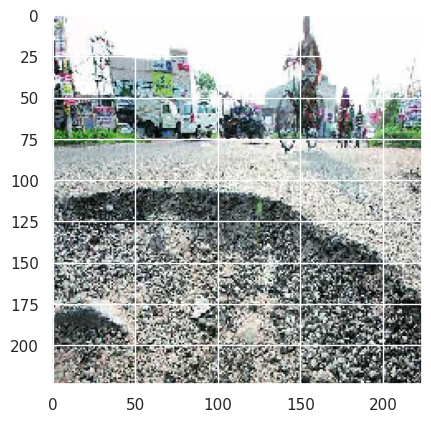

Predicted: Pothole
1/1 [==============================] - 0s 174ms/step


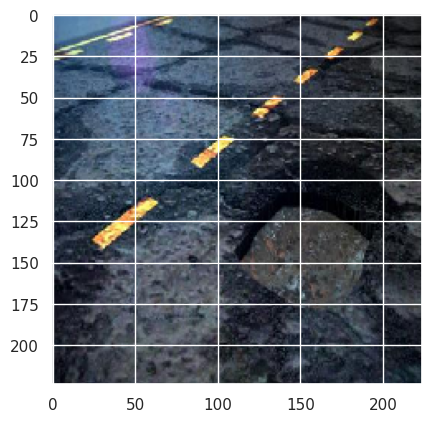

Predicted: Pothole
1/1 [==============================] - 0s 190ms/step


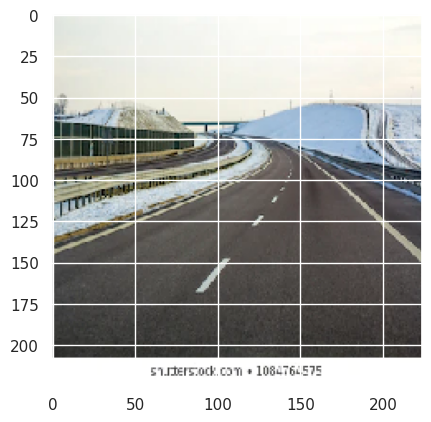

Predicted: Plain
1/1 [==============================] - 0s 183ms/step


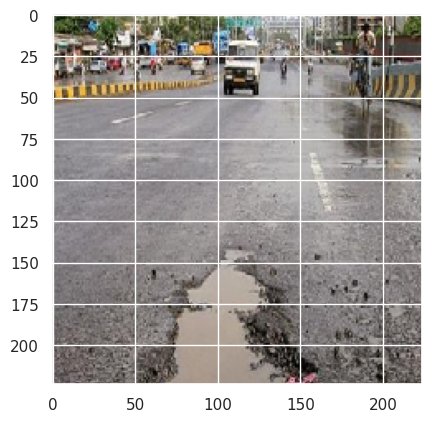

Predicted: Pothole
1/1 [==============================] - 0s 169ms/step


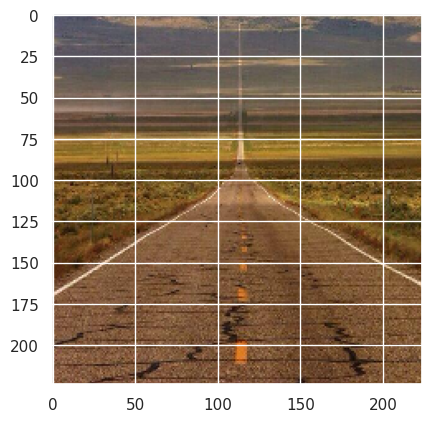

Predicted: Plain
1/1 [==============================] - 0s 199ms/step


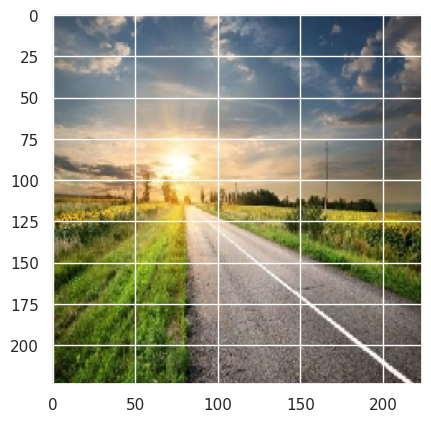

Predicted: Plain
1/1 [==============================] - 0s 170ms/step


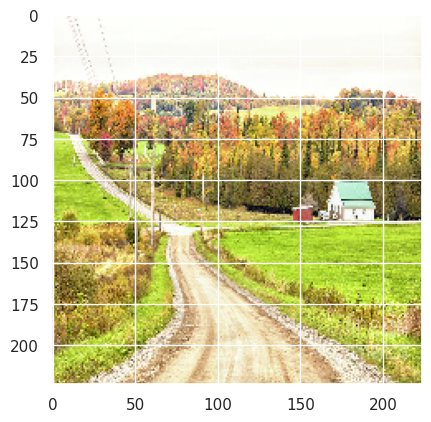

Predicted: Plain
1/1 [==============================] - 0s 160ms/step


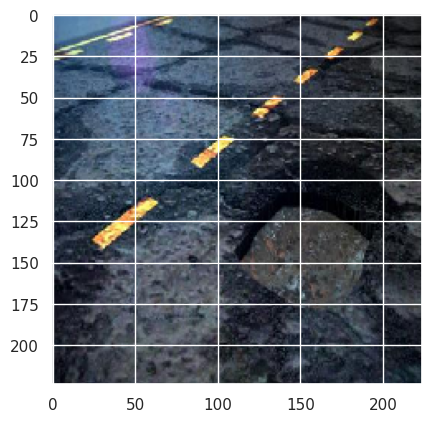

Predicted: Pothole
1/1 [==============================] - 0s 174ms/step


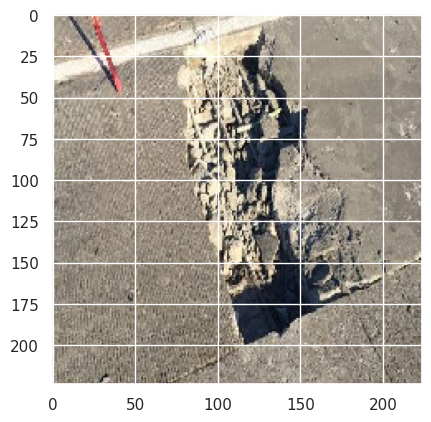

Predicted: Pothole
1/1 [==============================] - 0s 170ms/step


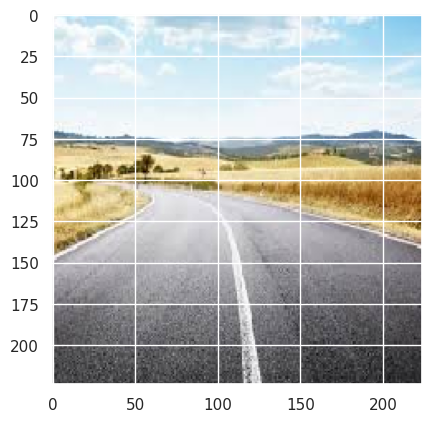

Predicted: Plain
1/1 [==============================] - 0s 188ms/step


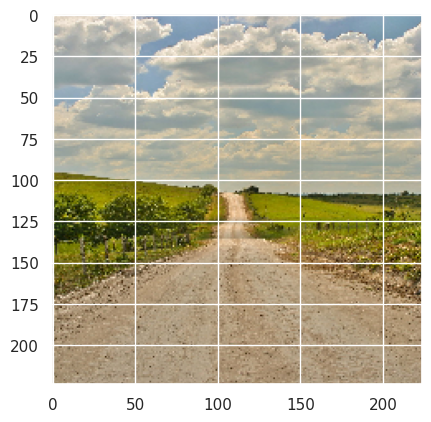

Predicted: Plain


In [20]:
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def visualize_predictions(classifier, n_cases, class_names):
    for i in range(n_cases):
        path = random.choice(['/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test/test_plain', '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test/test_pothole'])

        random_img = random.choice(os.listdir(path))
        img_path = os.path.join(path, random_img)
        img = image.load_img(img_path, target_size=(224, 224))
        img_tensor = image.img_to_array(img)
        img_tensor = np.expand_dims(img_tensor, axis=0)
        img_tensor = preprocess_for_vit(img_tensor)  # Make sure to match the preprocessing of VGG16

        prediction = classifier.predict(img_tensor)
        prediction = np.argmax(prediction, axis=1)

        plt.imshow(img)
        plt.show()

        print(f"Predicted: {class_names[prediction[0]]}")

# Example usage, assuming class_names are defined (e.g., class_names = ['Plain', 'Pothole'])
visualize_predictions(model, 50, ['Plain', 'Pothole'])


In [21]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from keras.applications.vgg16 import preprocess_input

def gather_predictions(classifier, test_dir, n_cases, class_names):
    predictions = []
    true_labels = []

    for _ in range(n_cases):
        for class_index, class_name in enumerate(class_names):
            path = os.path.join(test_dir, class_name.lower())
            random_img = random.choice(os.listdir(path))
            img_path = os.path.join(path, random_img)
            img = image.load_img(img_path, target_size=(224, 224))
            img_tensor = image.img_to_array(img)
            img_tensor = np.expand_dims(img_tensor, axis=0)
            img_tensor = preprocess_for_vit(img_tensor)

            pred = classifier.predict(img_tensor)
            pred_class = np.argmax(pred, axis=1)[0]

            predictions.append(pred_class)
            true_labels.append(class_index)  # Assumes directories are named after class names

    return true_labels, predictions

# Example usage
true_labels, predictions = gather_predictions(model, '/content/drive/MyDrive/mmds4/mmds-20231225T212418Z-001/mmds/test', 130, ['test_Plain', 'test_Pothole'])


1/1 [==============================] - 0s 161ms/step


Precision: 0.9202898550724637
Recall: 0.9769230769230769
F1 Score: 0.9477611940298507
Accuracy: 0.9461538461538461


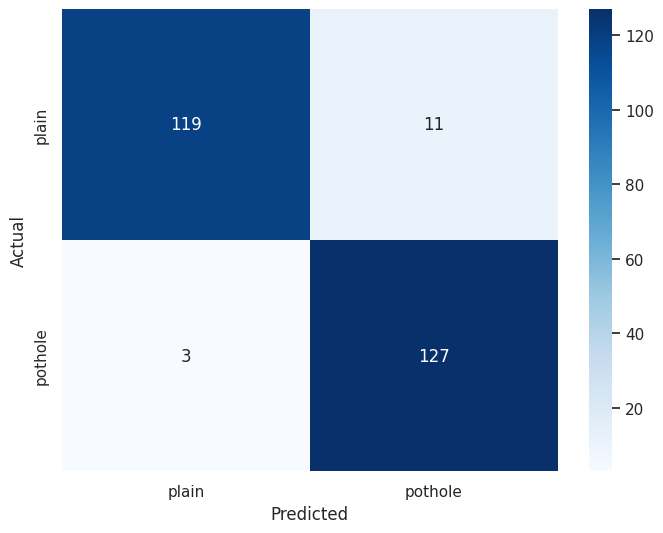

In [22]:
# Calculate precision, recall, F1 score, and accuracy
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
f1 = f1_score(true_labels, predictions)
accuracy = accuracy_score(true_labels, predictions)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

# Generate and display a confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
